<a href="https://colab.research.google.com/github/YuktaJoshi5/Data-Mining/blob/main/Bank_customer_segmentation_IPYNB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem 1: Clustering

A leading bank wants to develop a customer segmentation to give promotional offers to its customers. They collected a sample that summarizes the activities of users during the past few months. You are given the task to identify the segments based on credit card usage.


1.1 Read the data, do the necessary initial steps, and exploratory data analysis (Univariate, Bi-variate, and multivariate analysis).

1.2  Do you think scaling is necessary for clustering in this case? Justify

1.3 Apply hierarchical clustering to scaled data. Identify the number of optimum clusters using Dendrogram and briefly describe them

1.4 Apply K-Means clustering on scaled data and determine optimum clusters. Apply elbow curve. Explain the results properly. Interpret and write inferences on the finalized clusters.

1.5 Describe cluster profiles for the clusters defined. Recommend different promotional strategies for different clusters.

Dataset for Problem 1: bank_marketing_part1_Data.csv

## Data Dictionary for Market Segmentation:

1. spending: Amount spent by the customer per month (in 1000s)

2. advance_payments: Amount paid by the customer in advance by cash (in 100s)

3. probability_of_full_payment: Probability of payment done in full by the customer to the bank

4. current_balance: Balance amount left in the account to make purchases (in 1000s)

5. credit_limit: Limit of the amount in credit card (10000s)

6. min_payment_amt : minimum paid by the customer while making payments for purchases made monthly (in 100s)

7. max_spent_in_single_shopping: Maximum amount spent in one purchase (in 1000s)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
%matplotlib inline
from scipy import stats
import plotly.express as px
import warnings

# 1.1 Read the data and do exploratory data analysis. Describe the data briefly

In [ ]:
df= pd.read_csv(r'bank_marketing.csv')

In [ ]:
df.head(10)

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping
0,19.94,16.92,0.8752,6.675,3.763,3.252,6.550
1,15.99,14.89,0.9064,5.363,3.582,3.336,5.144
2,18.95,16.42,0.8829,6.248,3.755,3.368,6.148
3,10.83,12.96,0.8099,5.278,2.641,5.182,5.185
4,17.99,15.86,0.8992,5.890,3.694,2.068,5.837
5,12.70,13.41,0.8874,5.183,3.091,8.456,5.000
6,12.02,13.33,0.8503,5.350,2.810,4.271,5.308
7,13.74,14.05,0.8744,5.482,3.114,2.932,4.825
8,18.17,16.26,0.8637,6.271,3.512,2.853,6.273
9,11.23,12.88,0.8511,5.140,2.795,4.325,5.003


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210 entries, 0 to 209
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   spending                      210 non-null    float64
 1   advance_payments              210 non-null    float64
 2   probability_of_full_payment   210 non-null    float64
 3   current_balance               210 non-null    float64
 4   credit_limit                  210 non-null    float64
 5   min_payment_amt               210 non-null    float64
 6   max_spent_in_single_shopping  210 non-null    float64
dtypes: float64(7)
memory usage: 11.6 KB


In [ ]:
df.describe()

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000
mean,14.847524,14.559286,0.870999,5.628533,3.258605,3.700201,5.408071
std,2.909699,1.305959,0.023629,0.443063,0.377714,1.503557,0.491480
min,10.590000,12.410000,0.808100,4.899000,2.630000,0.765100,4.519000
25%,12.270000,13.450000,0.856900,5.262250,2.944000,2.561500,5.045000
50%,14.355000,14.320000,0.873450,5.523500,3.237000,3.599000,5.223000
75%,17.305000,15.715000,0.887775,5.979750,3.561750,4.768750,5.877000
max,21.180000,17.250000,0.918300,6.675000,4.033000,8.456000,6.550000


#### - Based on summary descriptive, the data looks good.
#### - We see for most of the variable, mean/medium are nearly equal
#### - Std Deviation is high for spending variable

In [ ]:
df[["spending","current_balance","max_spent_in_single_shopping"]] = df[["spending","current_balance","max_spent_in_single_shopping"]]*1000
df[["advance_payments" ,"min_payment_amt"]]=df[["advance_payments" ,"min_payment_amt"]]*100
df["credit_limit"]=df["credit_limit"]*10000

In [ ]:
df[["spending","current_balance","max_spent_in_single_shopping","advance_payments" ,"min_payment_amt","credit_limit"]].astype(int)

,spending,current_balance,max_spent_in_single_shopping,advance_payments,min_payment_amt,credit_limit
0,19940,6675,6550,1692,325,37630
1,15990,5363,5144,1489,333,35820
2,18950,6248,6148,1642,336,37550
3,10830,5278,5185,1296,518,26410
4,17990,5890,5837,1586,206,36940
...,...,...,...,...,...,...
205,13890,5439,4738,1402,398,31990
206,16770,5927,5795,1562,492,34380
207,14030,5438,5001,1416,171,32010
208,16120,5709,5443,1500,227,34850


In [ ]:
df.describe()

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000
mean,14847.523810,1455.928571,0.870999,5628.533333,32586.047619,370.020095,5408.071429
std,2909.699431,130.595873,0.023629,443.063478,3777.144449,150.355713,491.480499
min,10590.000000,1241.000000,0.808100,4899.000000,26300.000000,76.510000,4519.000000
25%,12270.000000,1345.000000,0.856900,5262.250000,29440.000000,256.150000,5045.000000
50%,14355.000000,1432.000000,0.873450,5523.500000,32370.000000,359.900000,5223.000000
75%,17305.000000,1571.500000,0.887775,5979.750000,35617.500000,476.875000,5877.000000
max,21180.000000,1725.000000,0.918300,6675.000000,40330.000000,845.600000,6550.000000


## UNIVARIATE ANALYSIS

In [ ]:
df.head()

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping
0,19940.0,1692.0,0.8752,6675.0,37630.0,325.2,6550.0
1,15990.0,1489.0,0.9064,5363.0,35820.0,333.6,5144.0
2,18950.0,1642.0,0.8829,6248.0,37550.0,336.8,6148.0
3,10830.0,1296.0,0.8099,5278.0,26410.0,518.2,5185.0
4,17990.0,1586.0,0.8992,5890.0,36940.0,206.8,5837.0


In [ ]:
# questions
#1. probability of them making the full payment
#2. understanding the advance_{payment distribution.
#3. DIstribution of the credit limit.
#4. Distribution of max_spent_in_single_shopping.


def boxplot_with_average(df,col = ""):
    mean_value = df[col].mean()

    fig = px.box(df[col], points="all", title = f'customer credit card {col} distribution')
    fig.add_shape(
        type="line",
        x0=0,
        x1=1,
        y0=mean_value,
        y1=mean_value,
        line=dict(color="red", width=2)
    )

    fig.add_annotation(
        x=0.5,
        y=mean_value,
        text=f'Mean: {mean_value:.2f}',
        showarrow=True,
        arrowhead=7,
        ax=0,
        ay=-40
    )

    return fig.show()


In [ ]:
df.columns

Index(['spending', 'advance_payments', 'probability_of_full_payment',
       'current_balance', 'credit_limit', 'min_payment_amt',
       'max_spent_in_single_shopping'],
      dtype='object')

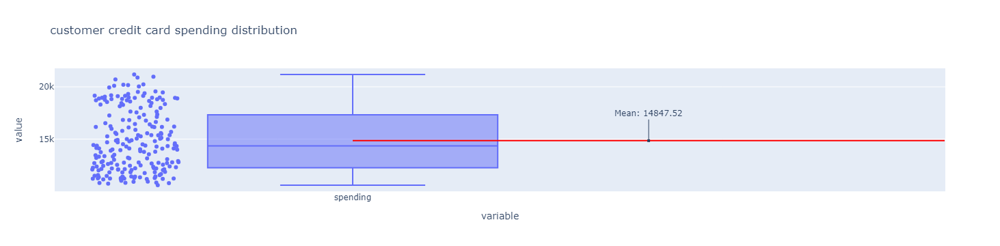

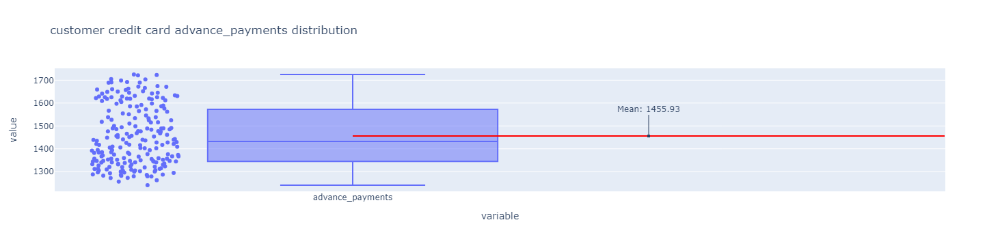

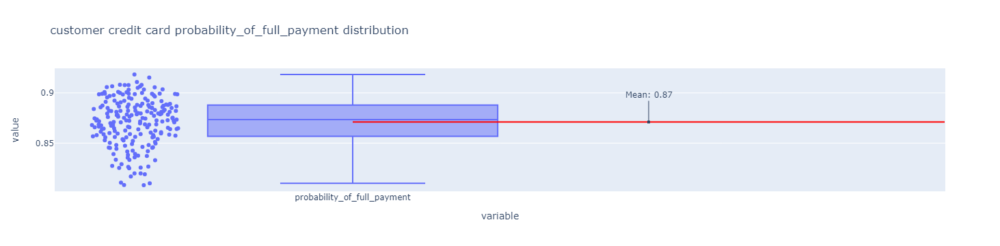

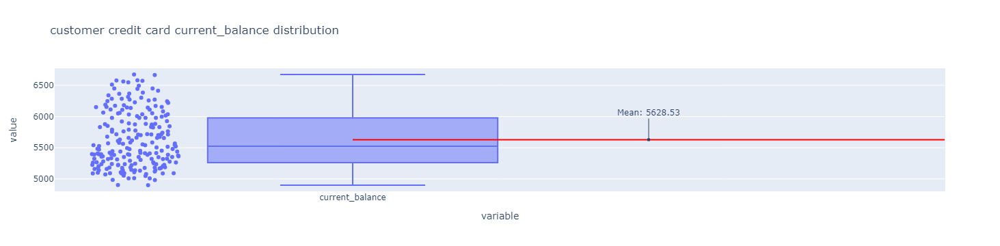

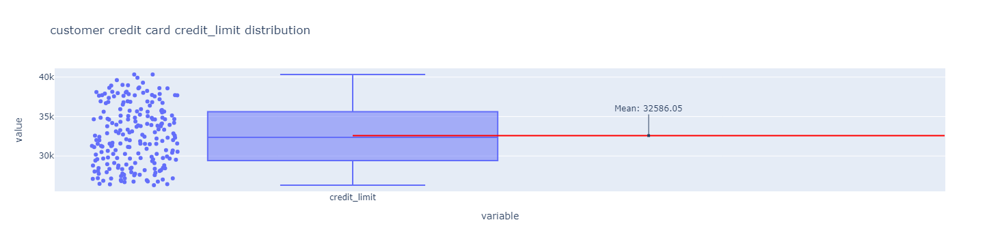

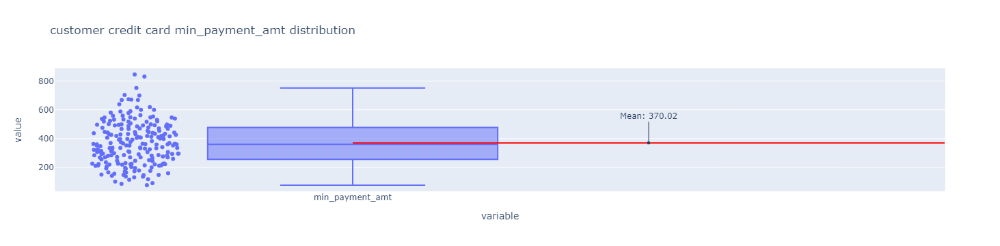

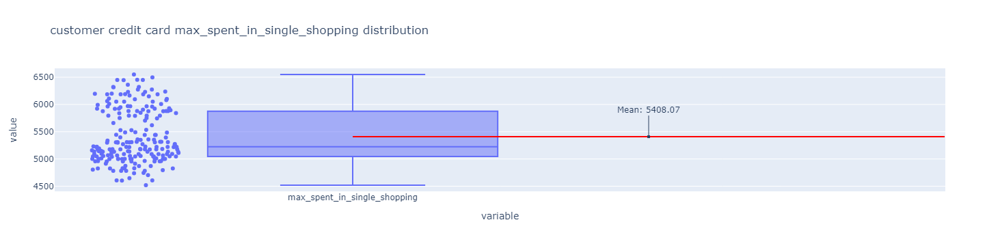

In [ ]:
boxplot_cols = ['spending', 'advance_payments', 'probability_of_full_payment',
       'current_balance', 'credit_limit', 'min_payment_amt',
       'max_spent_in_single_shopping']

for i in boxplot_cols:
    boxplot_with_average(df, col = i)



##### - we have outliers in two of our parameters: minimum_payment_amount and probability_of_full_payment which are not extreme values thus, outlier untreated data can be used for the interpretation.

In [ ]:
for i in df.describe().columns:
    print(f'''{i}\n 1. The maximum {i} among all customers: {df.describe().loc["max",i]}
 2. The minimum {i} among all customers:  {df.describe().loc["min",i]}
 3. The median {i} among all customers :  {round(df.describe().loc["50%",i],2)}
 4. The average for {i} among all customers :  {round(df.describe().loc["mean",i],2)} \n''')

spending
 1. The maximum spending among all customers: 21180.0 
 2. The minimum spending among all customers:  10590.0 
 3. The median spending among all customers :  14355.0 
 4. The average for spending among all customers :  14847.52 

advance_payments
 1. The maximum advance_payments among all customers: 1725.0 
 2. The minimum advance_payments among all customers:  1241.0 
 3. The median advance_payments among all customers :  1432.0 
 4. The average for advance_payments among all customers :  1455.93 

probability_of_full_payment
 1. The maximum probability_of_full_payment among all customers: 0.9183 
 2. The minimum probability_of_full_payment among all customers:  0.8081 
 3. The median probability_of_full_payment among all customers :  0.87 
 4. The average for probability_of_full_payment among all customers :  0.87 

current_balance
 1. The maximum current_balance among all customers: 6675.0 
 2. The minimum current_balance among all customers:  4899.0 
 3. The median current

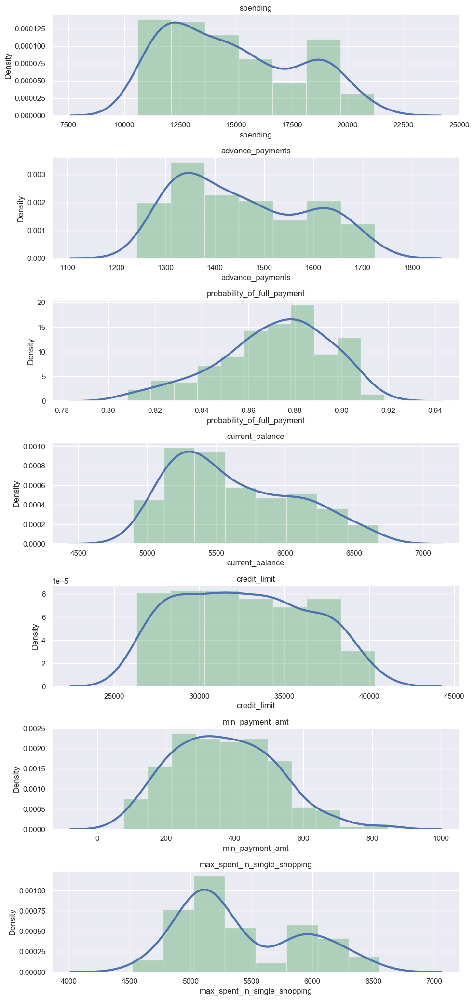

In [ ]:
warnings.filterwarnings("ignore")

plt.figure(figsize=(10,50))
for i in range(len(df.columns)):
  plt.subplot(17, 1, i+1)
  sns.distplot(df[df.columns[i]], kde_kws={"color": "b", "lw": 3, "label": "KDE"}, hist_kws={"color": "g"})
  plt.title(df.columns[i])

plt.tight_layout()


###### - Other than min_payment_amount and credit_limit the other parameters like max_spent_in_single_shopping, current_balance, spending, advance_payments shows bimodal structure that is the population is divided into two clusters. Where current balance is left skewed that is the population majorly distributed on the left side and probability_of_full_payment is right skewed that is majorly the population is distributed on the right side.

In [ ]:
df.describe()

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000
mean,14847.523810,1455.928571,0.870999,5628.533333,32586.047619,370.020095,5408.071429
std,2909.699431,130.595873,0.023629,443.063478,3777.144449,150.355713,491.480499
min,10590.000000,1241.000000,0.808100,4899.000000,26300.000000,76.510000,4519.000000
25%,12270.000000,1345.000000,0.856900,5262.250000,29440.000000,256.150000,5045.000000
50%,14355.000000,1432.000000,0.873450,5523.500000,32370.000000,359.900000,5223.000000
75%,17305.000000,1571.500000,0.887775,5979.750000,35617.500000,476.875000,5877.000000
max,21180.000000,1725.000000,0.918300,6675.000000,40330.000000,845.600000,6550.000000


In [ ]:
# The variance of each variable
df.var()

spending                        8.466351e+06
advance_payments                1.705528e+04
probability_of_full_payment     5.583493e-04
current_balance                 1.963052e+05
credit_limit                    1.426682e+07
min_payment_amt                 2.260684e+04
max_spent_in_single_shopping    2.415531e+05
dtype: float64

###### - From the above table though there is not much variance between most of the variables, our target variable spending has a variance of 8.46 whereas other variables variance lie between 1, 2 and 5. Hence scaling is necessary.

###### - We will be using the Standard Scaler method for scaling our data. This method will calculate the z-score for each data point and then scale the data such that mean = 0 and variance/standard deviation = 1.

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
scaled_df = sc.fit_transform(df)

In [ ]:
scaled_df

array([[ 1.75435461,  1.81196782,  0.17822987, ...,  1.33857863,
        -0.29880602,  2.3289982 ],
       [ 0.39358228,  0.25383997,  1.501773  , ...,  0.85823561,
        -0.24280501, -0.53858174],
       [ 1.41330028,  1.42819249,  0.50487353, ...,  1.317348  ,
        -0.22147129,  1.50910692],
       ...,
       [-0.2816364 , -0.30647202,  0.36488339, ..., -0.15287318,
        -1.3221578 , -0.83023461],
       [ 0.43836719,  0.33827054,  1.23027698, ...,  0.60081421,
        -0.95348449,  0.07123789],
       [ 0.24889256,  0.45340314, -0.77624835, ..., -0.07325831,
        -0.70681338,  0.96047321]])

In [ ]:
scaled_df = pd.DataFrame(scaled_df, index=df.index, columns=df.columns)

In [ ]:
scaled_df.head()

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping
0,1.754355,1.811968,0.178230,2.367533,1.338579,-0.298806,2.328998
1,0.393582,0.253840,1.501773,-0.600744,0.858236,-0.242805,-0.538582
2,1.413300,1.428192,0.504874,1.401485,1.317348,-0.221471,1.509107
3,-1.384034,-1.227533,-2.591878,-0.793049,-1.639017,0.987884,-0.454961
4,1.082581,0.998364,1.196340,0.591544,1.155464,-1.088154,0.874813


In [ ]:
df.skew().sort_values(ascending=False)

max_spent_in_single_shopping    0.561897
current_balance                 0.525482
min_payment_amt                 0.401667
spending                        0.399889
advance_payments                0.386573
credit_limit                    0.134378
probability_of_full_payment    -0.537954
dtype: float64

### Positive Skewness:
##### - Variables with positive skewness (values greater than 0) have a distribution that is skewed to the right. This means that the distribution has a longer right tail, and the majority of the data points are concentrated on the left side.

### Negative Skewness:
##### - Variables with negative skewness (values less than 0) have a distribution that is skewed to the left. This means that the distribution has a longer left tail, and the majority of the data points are concentrated on the right side.

### Skewness Close to 0:
##### - Skewness values close to 0 indicate a distribution that is approximately symmetric.


##### a. max_spent_in_single_shopping: Positive skewness (0.561897) indicates a right-skewed distribution.
##### b. current_balance: Positive skewness (0.525482) indicates a right-skewed distribution.
##### c. min_payment_amt: Positive skewness (0.401667) indicates a right-skewed distribution.
##### d. spending: Positive skewness (0.399889) indicates a right-skewed distribution.
##### e. advance_payments: Positive skewness (0.386573) indicates a right-skewed distribution.
##### f. credit_limit: Positive skewness (0.134378) indicates a right-skewed distribution, but less pronounced compared to the other variables.
##### g. probability_of_full_payment: Negative skewness (-0.537954) indicates a left-skewed distribution.

##### - The positive skewness suggests that the distribution of the data is right-skewed, meaning there are some relatively large values on the right side (tail) of the distribution. However, the Negative skewness indicates a left-skewed distribution, where smaller values are concentrated on the left side.

# BIVARIATE ANALYSIS

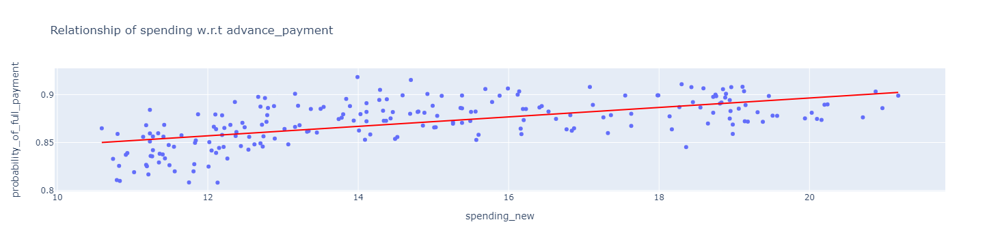

In [ ]:
# 1. Relationship of spending w.r.t advance_payment

df["spending_new"] = df["spending"]/1000
fig = px.scatter(df, x = "spending_new", y= "probability_of_full_payment", trendline_color_override="red", trendline = "ols", title ="Relationship of spending w.r.t advance_payment")
fig.show()

###### - The R2 value 0.37 means that 37% of the total variability in the PROBABILITY_OF_FULL_PAYMENT is explained by the SPENDING included in the model. There isnt much of positive relation between the two parameters.

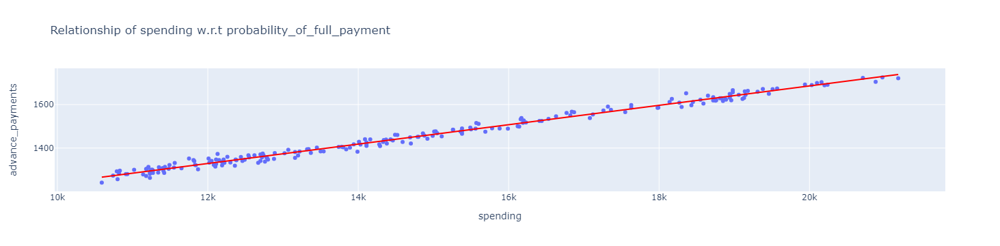

In [ ]:
# 2.Relationship of spending w.r.t probability_of_full_payment

fig = px.scatter(df, x = "spending",y= "advance_payments", trendline = "ols",  trendline_color_override='red', title = "Relationship of spending w.r.t probability_of_full_payment")
fig.show()

###### - The value 0.988 means that 98.8% of the total variability in the ADVANCE_PAYMENTS is explained by the SPENDING included in the model. From the above plot we can conclude that the ones with high spending nature also are the ones who are also prone to advance_payments.

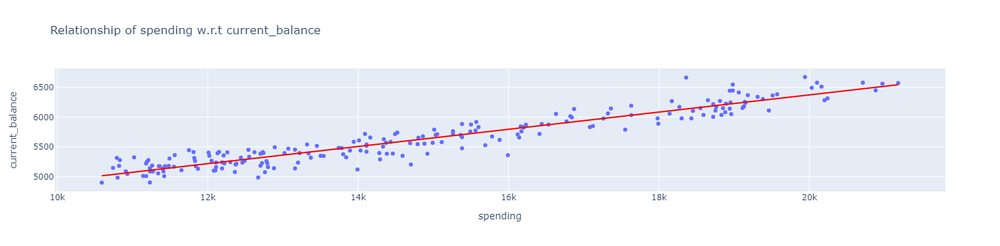

In [ ]:
# 3.Relationship of spending w.r.t current_balance

fig = px.scatter(df, x = "spending",y= "current_balance",trendline_color_override='red', trendline = "ols", title = "Relationship of spending w.r.t current_balance")
fig.show()

###### - The value 0.904 means that 90.4% of the total variability in the CURRENT_BALANCE is explained by the SPENDING included in the model. From the above plot we can conclude that the ones with high current_balance are ones with high spending nature.

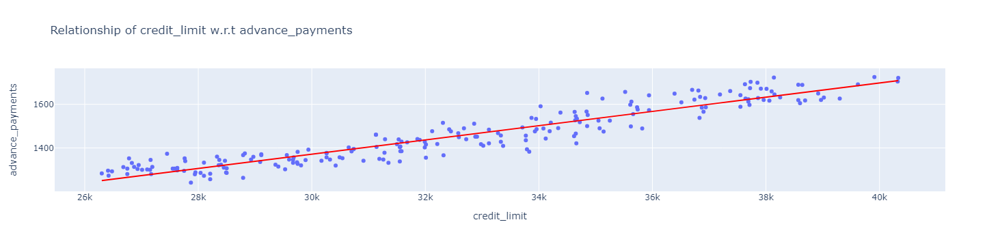

In [ ]:
# 3.Relationship of credit_limit w.r.t advance_payments

fig = px.scatter(df, x = "credit_limit",y= "advance_payments",trendline_color_override='red', trendline = "ols", title = "Relationship of credit_limit w.r.t advance_payments")
fig.show()

###### - The value 0.892 means that 89.2% of the total variability in the ADVANCE_PAYMENTS is explained by the CREDIT_LIMIT included in the model.

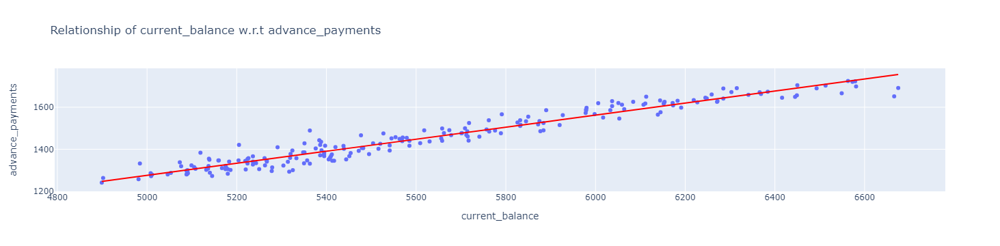

In [ ]:
# 4. Relationship of current_balance w.r.t advance_payments

fig = px.scatter(df, x = "current_balance",y= "advance_payments",trendline_color_override='red', trendline = "ols", title = "Relationship of current_balance w.r.t advance_payments")
fig.show()

###### - The value 0.945 means that 94.5% of the total variability in the ADVANCE_PAYMENTS is explained by the CURRENT_BALANCE included in the model. From the above plot we can conclude that the ones with high current_balance are ones with high advance_payments.

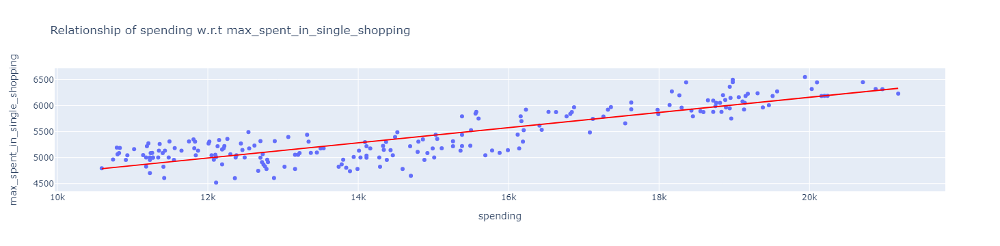

In [ ]:
# 5. Relationship of spending w.r.t max_spent_in_single_shopping

fig = px.scatter(df, x = "spending",y= "max_spent_in_single_shopping",trendline_color_override='red', trendline = "ols", title = "Relationship of spending w.r.t max_spent_in_single_shopping")
fig.show()

###### - The value 0.745 means that 74.5% of the total variability in the MAX_SPENT_IN_SINGLE_SHOPPING is explained by the SPENDING included in the model.

## BIVARIATE ANALYSIS

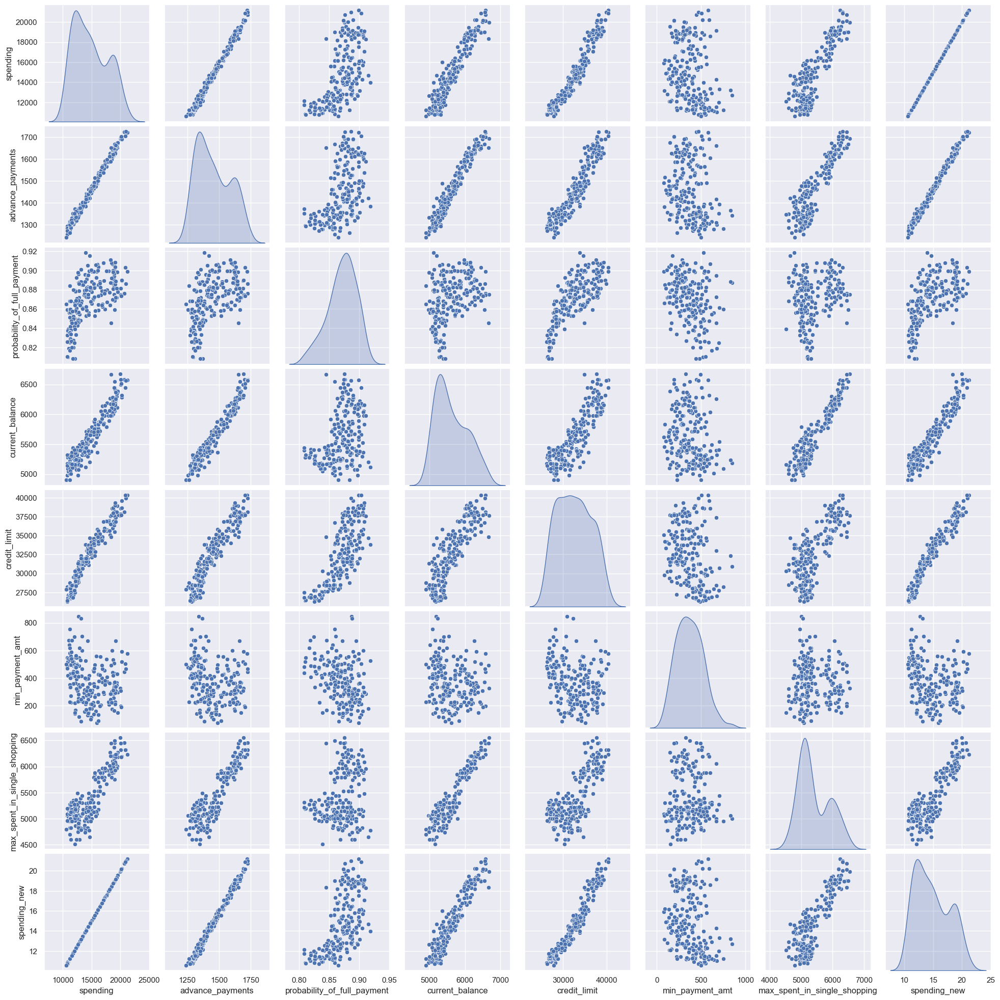

In [ ]:
pair_plot = sns.pairplot(df,diag_kind='kde')

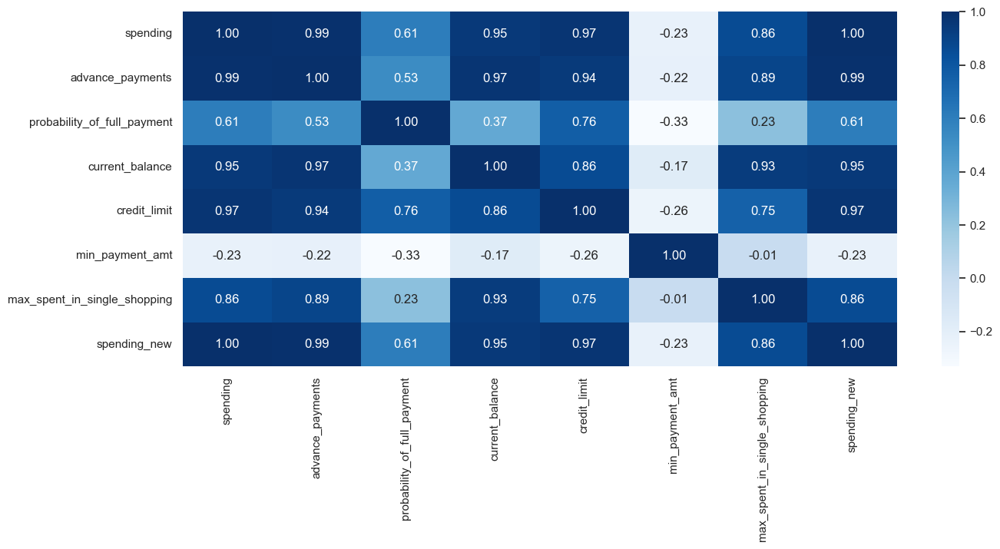

In [ ]:
plt.figure(figsize=(15,6))
sns.heatmap(df.corr(),annot=True,fmt=".2f",cmap="Blues")
plt.show()

##### - The top 3 parameters with high correlations are advance_payment and spending(0.99), credit limit and spending(0.97), current_balance and advance payment(0.97).
##### - Top 3 parameters with negative correlations are minimum_payment and probability_of_full_Payment(-0.33), minimumum_payment and credit_limit(-0.26),spending and minimum_payment_amount(-0.23).

##### - From the above pairplot and correlation heatmaps, we can see that there is positive linear relationship between advance_payments and spending, current_balance and spending, credit_limit and spending, current_balance and advance_payments, credit_limit and advance_payments, max_spent_in_single_shopping and current_balance. This suggests that there is Multicollinearity between the variables.

### K_MEANS

In [ ]:
import warnings
warnings.filterwarnings("ignore", category = FutureWarning)
from sklearn.cluster import KMeans

wcss = []
for i in range(1,12,1):
    kmean = KMeans(n_clusters = i, random_state = 1)
    kmean.fit_predict(scaled_df)
    wcss.append(kmean.inertia_)

print('within cluster sum of sqaure values for various k values :', '\n',wcss)

a = []
for i in range(1,12):
    a.append(i)
print('k values',a)

within cluster sum of sqaure values for various k values : 
 [1470.0000000000005, 659.1717544870407, 430.65897315130064, 371.18461253510196, 327.5038437438553, 289.21172641354946, 262.35689314588, 241.52905755767307, 220.38691712827782, 203.84391282812084, 196.81144038536883]
k values [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]


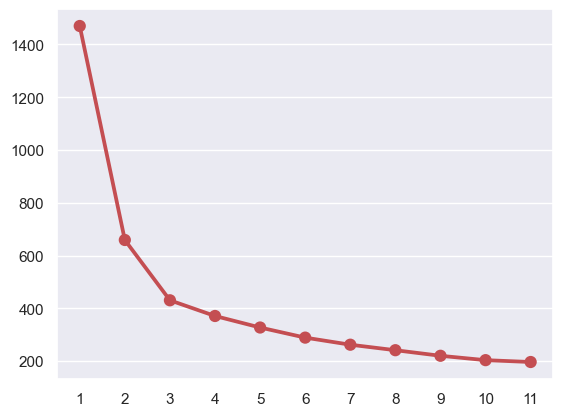

In [ ]:
sns.pointplot(x = a,y = wcss, color = "r")
plt.show()

###### - From the elbow plot we can conclude that 3 is the optimal cluster. However, to be sure on the quality of the cluster we will perform a quality test called Silhouette score.

In [ ]:
#SILHOUETTE SCORE

from sklearn.metrics import silhouette_score, silhouette_samples

In [ ]:
k_value = [2,3,4]
for i in k_value:
    kmean = KMeans(n_clusters=i, random_state=2)
    label = kmean.fit_predict(scaled_df)
    sil_score = silhouette_score(scaled_df, label, random_state=2)
    if sil_score == 1:
        print('sil_score for k_value',i,'is',sil_score, '- Clusters nicely separated')
    elif sil_score > 0 or sil_score < 1:
        print('sil_score for k_value',i,'is',sil_score, '- Clusters moderately separated, a few overlapping')
    else:
        print('sil_score for k_value',i,'is',sil_score, '- The data belonging to clusters may be wrong/incorrect')

sil_score for k_value 2 is 0.46577247686580914 - Clusters moderately separated, a few overlapping
sil_score for k_value 3 is 0.40072705527512986 - Clusters moderately separated, a few overlapping
sil_score for k_value 4 is 0.321247478202374 - Clusters moderately separated, a few overlapping


###### - As the k value 2 has the highest silhouette score(0.465) and 3 has (0.40) we will go with 2 and 3 as the number of cluster.

In [ ]:
sil_score = []

for i in range(2,11):
    kmean = KMeans(n_clusters=i)
    kmean.fit(scaled_df)
    labels = kmean.labels_
    sil = silhouette_score(scaled_df,labels)
    print( i,'-', sil)
    sil_score.append(sil)

2 - 0.46577247686580914
3 - 0.40072705527512986
4 - 0.3347912611982698
5 - 0.2794935063392787
6 - 0.27611570765049864
7 - 0.2804225995613967
8 - 0.2554830824906815
9 - 0.265179477555579
10 - 0.2555497547421191


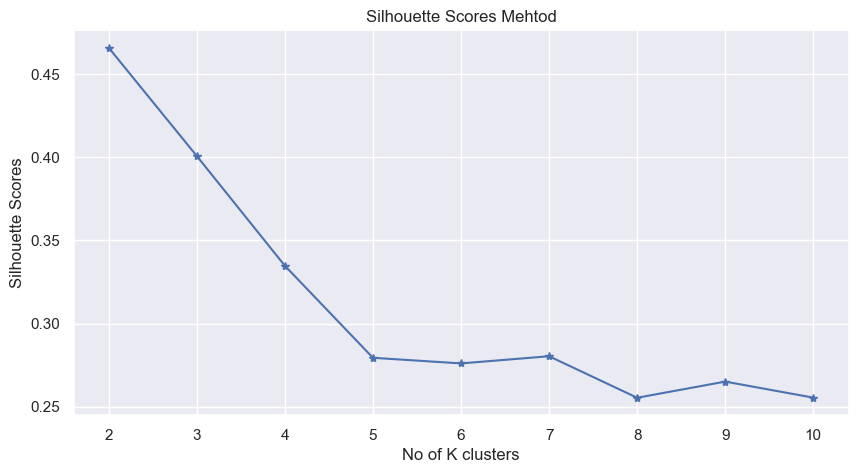

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(range(2,11), sil_score, marker='*', color='b')
plt.title('Silhouette Scores Mehtod')
plt.xlabel('No of K clusters')
plt.ylabel('Silhouette Scores')
plt.show();

# 2 cluster profiling

In [ ]:
kmean = KMeans(n_clusters=2, random_state=1)
label=kmean.fit_predict(scaled_df)
scaled_df['cluster'] = label
cluster_profile= scaled_df.groupby('cluster').mean()
cluster_profile['frequency'] = scaled_df['cluster'].value_counts().sort_index()
cluster_profile

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping,frequency
cluster,,,,,,,,
0,1.140654,1.147887,0.543769,1.128704,1.066613,-0.146525,1.149620,77
1,-0.660378,-0.664566,-0.314814,-0.653460,-0.617513,0.084830,-0.665569,133


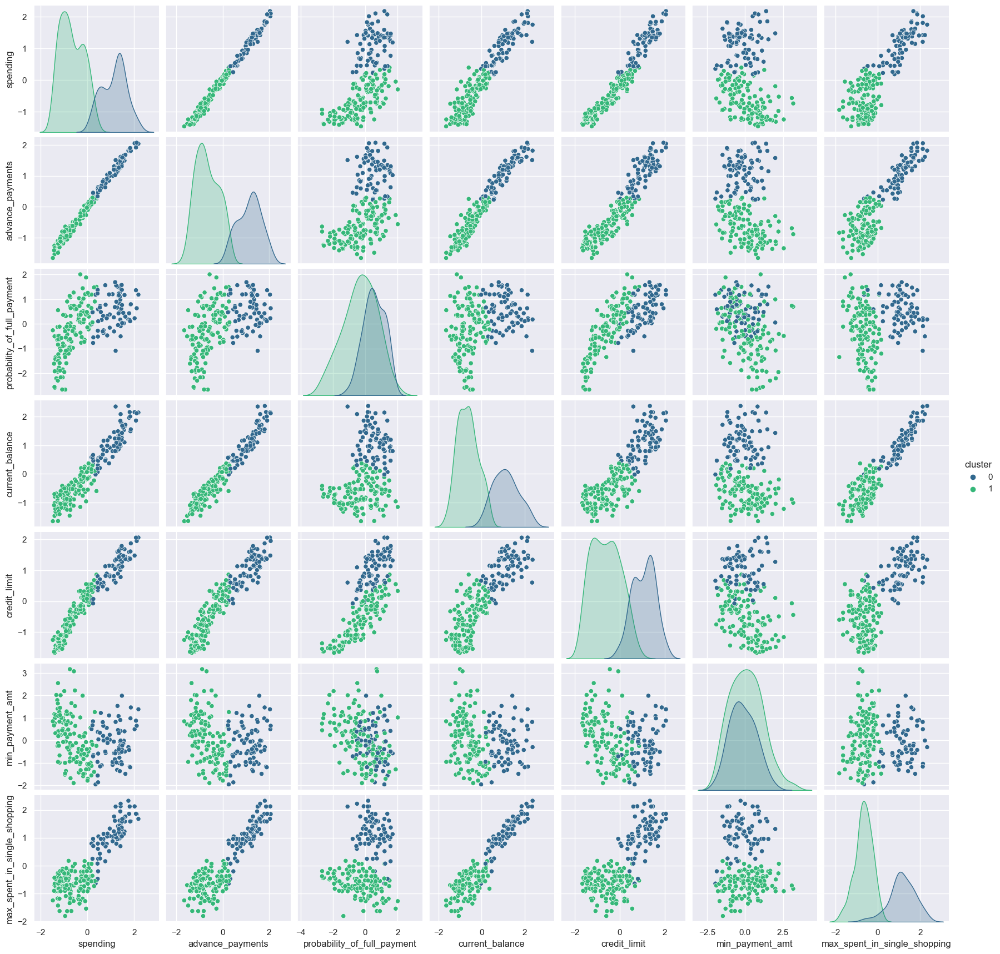

In [ ]:
sns.pairplot(scaled_df, hue='cluster', palette='viridis', diag_kind='kde')
plt.show()

##### - Cluster 1 - Includes the ones who are high spenders at the same time ones who does advance payment and have high credit limit, current balance, probability of full payment and maximum spent in single shopping. This signifies these are the ones to use credit card for regular purpose and can be counted under loyal ones. Thus, special offers can be provided to theis segment.

##### - Cluster 2 - Includes the ones who donot spend much and donot do advance payment also with low probability of them doing full payment with low credit limit and current balance. However, the minimum payment amount is high. This segment doesnt use the credit card that often thus such offers can be provided which can appeal and lead them to use the same on regular basis and can turn them into loyal customers.

# 3 cluster profiling

In [ ]:
df_new = scaled_df.copy()
df_new = df_new.drop('cluster', axis = 1)
kmean = KMeans(n_clusters=3, random_state=1)
label=kmean.fit_predict(df_new)
df_new['cluster3'] = label
cluster_profile= df_new.groupby('cluster3').mean()
cluster_profile['frequency'] = df_new['cluster3'].value_counts().sort_index()
cluster_profile

,spending,advance_payments,probability_of_full_payment,current_balance,credit_limit,min_payment_amt,max_spent_in_single_shopping,frequency
cluster3,,,,,,,,
0,1.256682,1.261966,0.560464,1.237883,1.164852,-0.045219,1.292308,67
1,-0.141119,-0.170043,0.449606,-0.257814,0.001647,-0.661919,-0.585893,71
2,-1.030253,-1.006649,-0.964905,-0.897685,-1.085583,0.694804,-0.624809,72


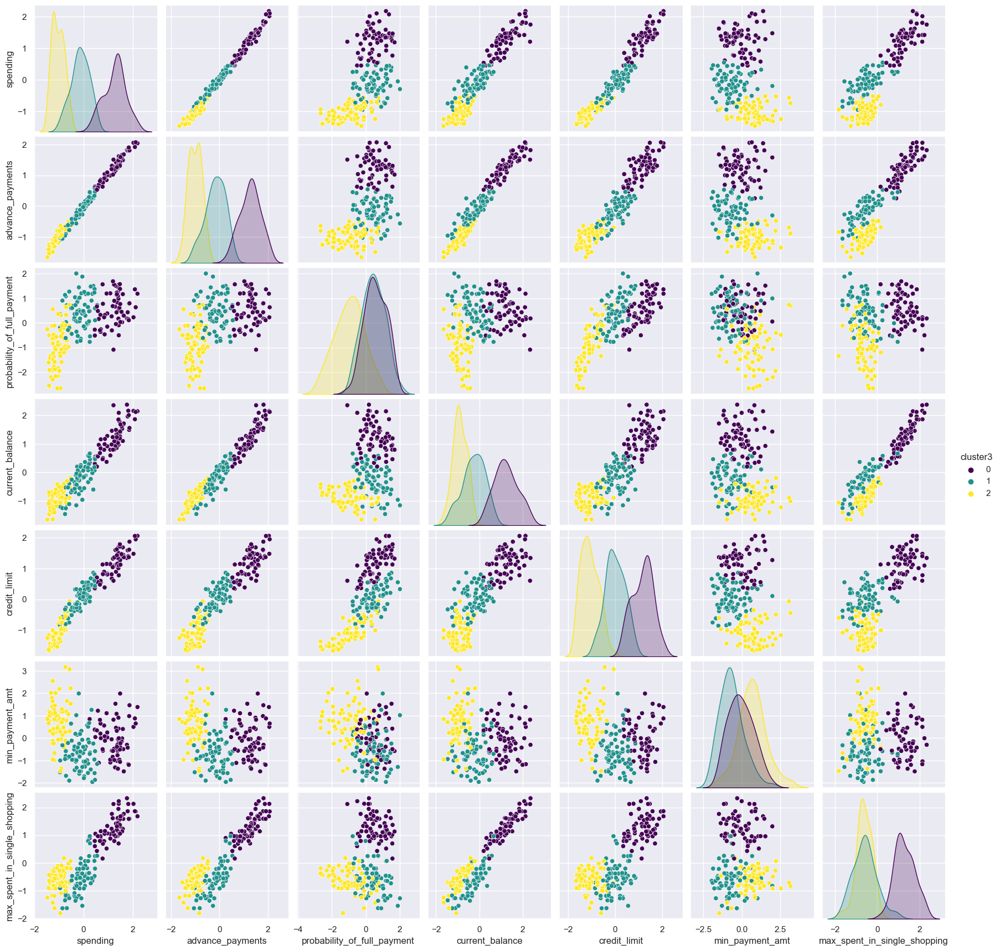

In [ ]:
sns.pairplot(df_new, hue='cluster3', palette='viridis', diag_kind='kde')
plt.show()

##### - Customers under cluster 1 have a high spending, current balance, credit_limit and max_spent_in_single_shopping which clearly shows that they are premium customers who make expensive purchases on their credit cards.

##### - Customers under cluster 2 have the least spending and credit_limits compared to other clusters. Bank can provide customized offers to this segment to promote more spending on credit cards.

##### - Customers under cluster 3 have a relatively lesser spending, current balance, credit_limit and max_spent_in_single_shopping. The bank can provide promotional offers to this group such that they increase their spending and are potential customers who can become loyal regular customers.